In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import anndata
import scanpy as sc
import os

sc.settings.n_jobs = 24
sc.settings.set_figure_params(dpi=180, dpi_save=300, frameon=False, figsize=(4, 4), fontsize=8, facecolor='white')

In [2]:
merlin_output_folder = r'J:\MERFISH_Analysis\20210529-P_Forebrain_MERFISH4_CTP09_exp2'

In [24]:
cell_meta_data_file = os.path.join(merlin_output_folder, 'ExportCellMetadata', 'feature_metadata.csv')
cell_meta_data = pd.read_csv(cell_meta_data_file)


In [25]:
cell_meta_data

,Unnamed: 0,fov,volume,center_x,center_y,min_x,max_x,min_y,max_y
0,106554852408208407576461294308997687583,0,792.434822,-3574.763947,-1712.975949,-3580.714747,-3568.813147,-1718.062749,-1707.889149
1,108775984176929829394048732224507327733,0,56.467118,-3655.115949,-1636.241947,-3657.286749,-3652.945149,-1638.898747,-1633.585147
2,109199569301920386655165990772443524306,0,955.039505,-3582.431947,-1598.387946,-3590.434747,-3574.429147,-1604.122746,-1592.653146
3,109716350018231728037064586336423316586,0,1256.605475,-3730.661951,-1592.825946,-3739.258751,-3722.065151,-1599.586746,-1586.065146
4,109826057650023140714188180361801236717,0,289.080124,-3744.966551,-1624.091947,-3746.699951,-3743.233151,-1633.066747,-1615.117147
...,...,...,...,...,...,...,...,...,...
9572,95574849223253722991218662104670121249,60,1184.441120,-361.575382,-903.276021,-366.926782,-356.223982,-911.278822,-895.273221
9573,97006928964722587837873306805951082199,60,1243.836894,-482.637985,-1013.922024,-489.722786,-475.553185,-1021.006824,-1006.837224
9574,97264448629076813276837314487859816806,60,79.261608,-520.329986,-1009.710024,-523.202786,-517.457186,-1012.582824,-1006.837224
9575,98056597772308839269761103267830392428,60,1024.111617,-426.369984,-935.676022,-432.806784,-419.933184,-941.734822,-929.617222


In [26]:
df

,1810046K07Rik,5031425F14Rik,Acta2,Adam2,Adamts2,Adamts4,Alk,Ankfn1,Ano4,Aqp4,...,Trpc6,Tunar,Unc13c,Unc5b,Unc5d,Ust,Vipr2,Vwc2,Wnt7b,Zfp804b
index,,,,,,,,,,,,,,,,,,,,,
106554852408208407576461294308997687583,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
108775984176929829394048732224507327733,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
109199569301920386655165990772443524306,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
109716350018231728037064586336423316586,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,2.0
109826057650023140714188180361801236717,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95574849223253722991218662104670121249,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
97006928964722587837873306805951082199,0.0,0.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
97264448629076813276837314487859816806,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [47]:
adata.obs

,n_genes_by_counts,total_counts
index,,
106554852408208407576461294308997687583,26,30.0
108775984176929829394048732224507327733,0,0.0
109199569301920386655165990772443524306,24,28.0
109716350018231728037064586336423316586,36,52.0
109826057650023140714188180361801236717,0,0.0
...,...,...
95574849223253722991218662104670121249,5,5.0
97006928964722587837873306805951082199,15,21.0
97264448629076813276837314487859816806,3,3.0


In [52]:
# Load MERFISH data
counts_file_mer = os.path.join(merlin_output_folder, 'ExportPartitionedBarcodes', 'barcodes_per_feature.csv')
df = pd.read_csv(counts_file_mer).rename(columns={'Unnamed: 0':'index'}).set_index('index')
#blanks = [f'Blank-{i}' for i in range(1, 11)]
for _c in df.columns:
    if 'Blank-' in _c:
        df = df.drop(columns=_c)
adata = anndata.AnnData(df)
adata.obs = adata.obs.merge(cell_meta_data, left_index=True, right_on='Unnamed: 0').set_index('Unnamed: 0')

In [61]:
adata.

(9577, 162)

In [41]:
# Calculate quality control metrics
sc.pp.calculate_qc_metrics(adata, percent_top=None, log1p=False, inplace=True)

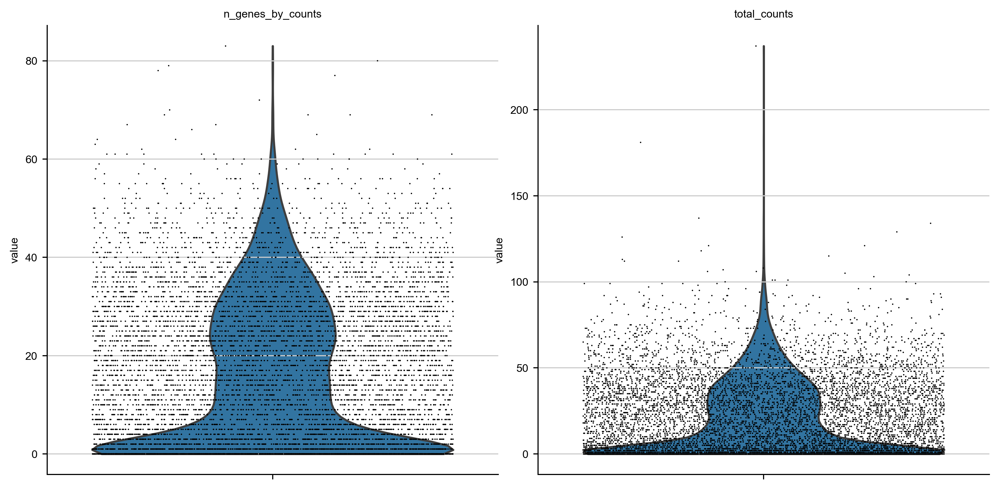

In [7]:
# A violin plot of some of the computed quality measures:
# - the number of genes expressed in the count matrix
# - the total counts per cell
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts'],
             jitter=0.4, multi_panel=True)

In [8]:
adata.obs

,fov,volume,center_x,center_y,min_x,max_x,min_y,max_y,n_genes_by_counts,total_counts
Unnamed: 0,,,,,,,,,,
106554852408208407576461294308997687583,0,792.434822,-3574.763947,-1712.975949,-3580.714747,-3568.813147,-1718.062749,-1707.889149,26,30.0
108775984176929829394048732224507327733,0,56.467118,-3655.115949,-1636.241947,-3657.286749,-3652.945149,-1638.898747,-1633.585147,0,0.0
109199569301920386655165990772443524306,0,955.039505,-3582.431947,-1598.387946,-3590.434747,-3574.429147,-1604.122746,-1592.653146,24,28.0
109716350018231728037064586336423316586,0,1256.605475,-3730.661951,-1592.825946,-3739.258751,-3722.065151,-1599.586746,-1586.065146,36,52.0
109826057650023140714188180361801236717,0,289.080124,-3744.966551,-1624.091947,-3746.699951,-3743.233151,-1633.066747,-1615.117147,0,0.0
...,...,...,...,...,...,...,...,...,...,...
95574849223253722991218662104670121249,60,1184.441120,-361.575382,-903.276021,-366.926782,-356.223982,-911.278822,-895.273221,5,5.0
97006928964722587837873306805951082199,60,1243.836894,-482.637985,-1013.922024,-489.722786,-475.553185,-1021.006824,-1006.837224,15,21.0
97264448629076813276837314487859816806,60,79.261608,-520.329986,-1009.710024,-523.202786,-517.457186,-1012.582824,-1006.837224,3,3.0


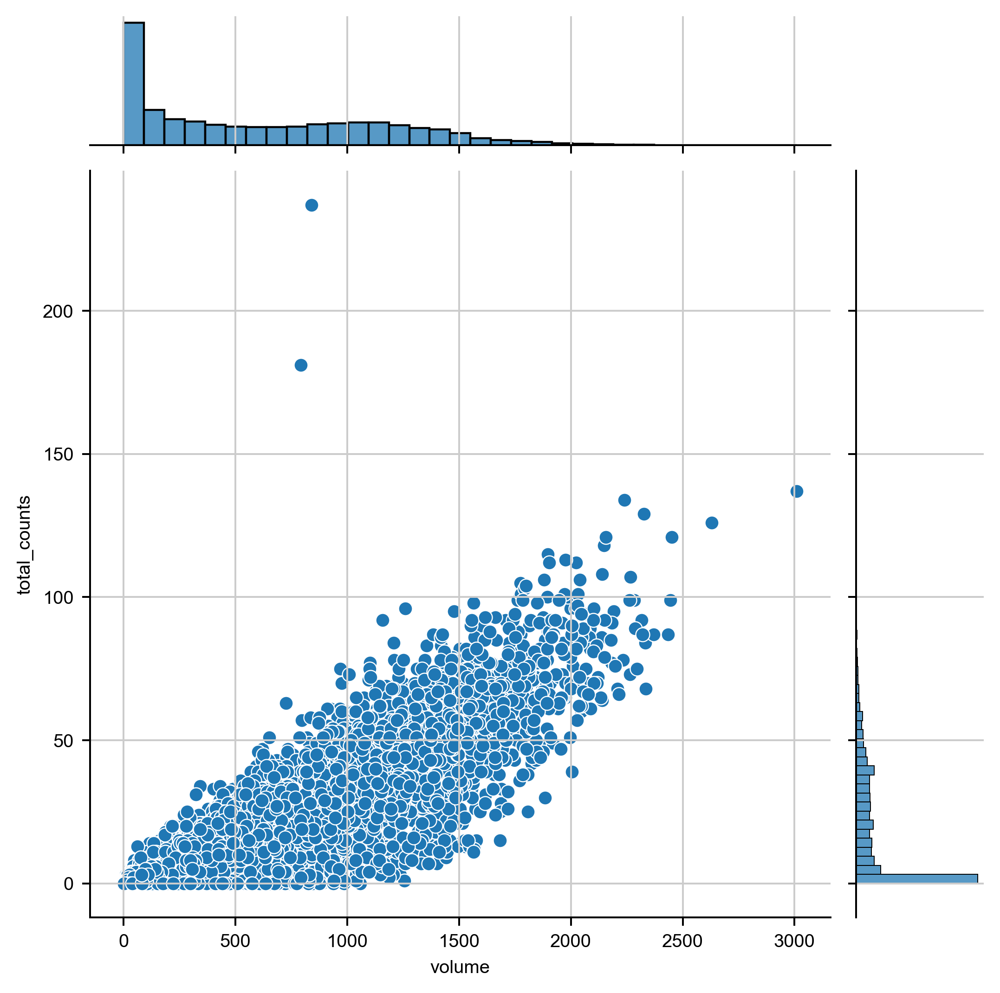

In [9]:
sns.jointplot(data=adata.obs, x='volume', y='total_counts')

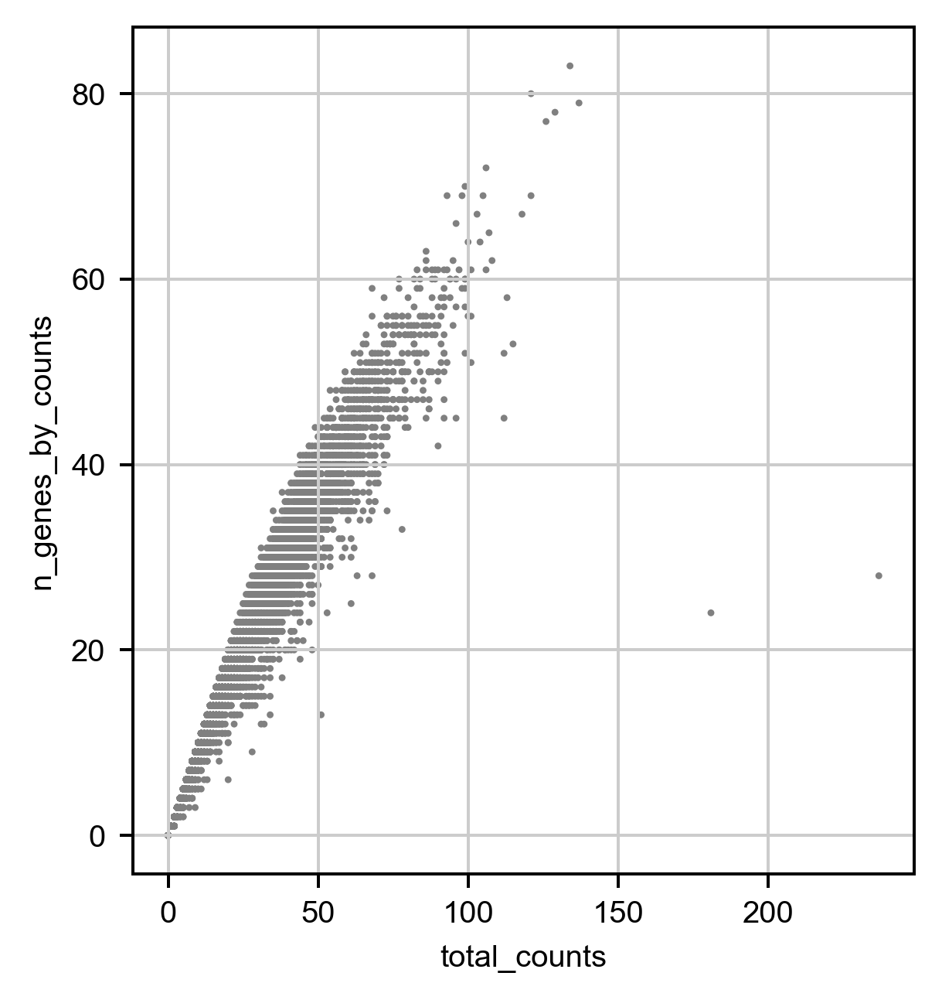

In [10]:
# Plot the distributions of gene counts
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [11]:
adata = adata[adata.obs['total_counts'] > 10]
adata = adata[adata.obs['n_genes_by_counts'] > 10]

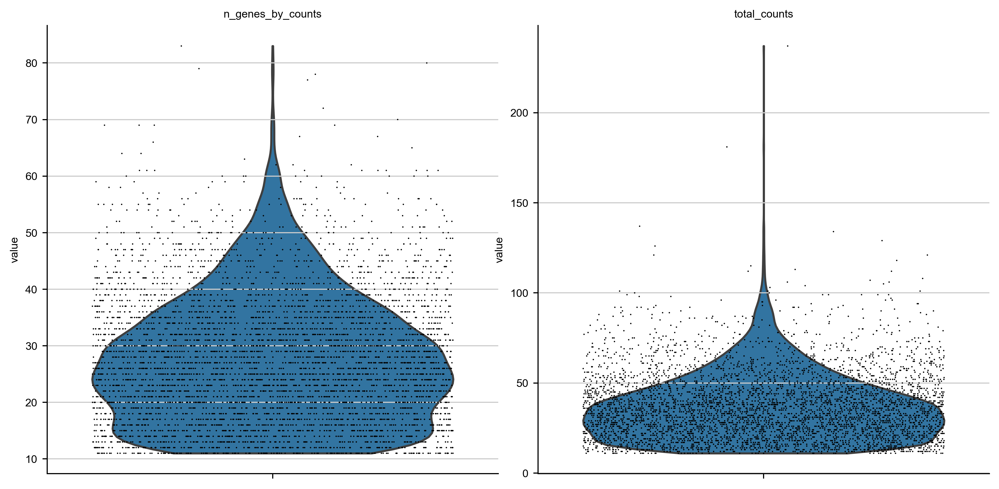

In [12]:
# A violin plot of some of the computed quality measures:
# - the number of genes expressed in the count matrix
# - the total counts per cell
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts'],
             jitter=0.4, multi_panel=True)

In [13]:
max(adata.obs['total_counts'])

237.0

E:\Users\puzheng\AppData\anaconda3\lib\site-packages\scanpy\preprocessing\_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


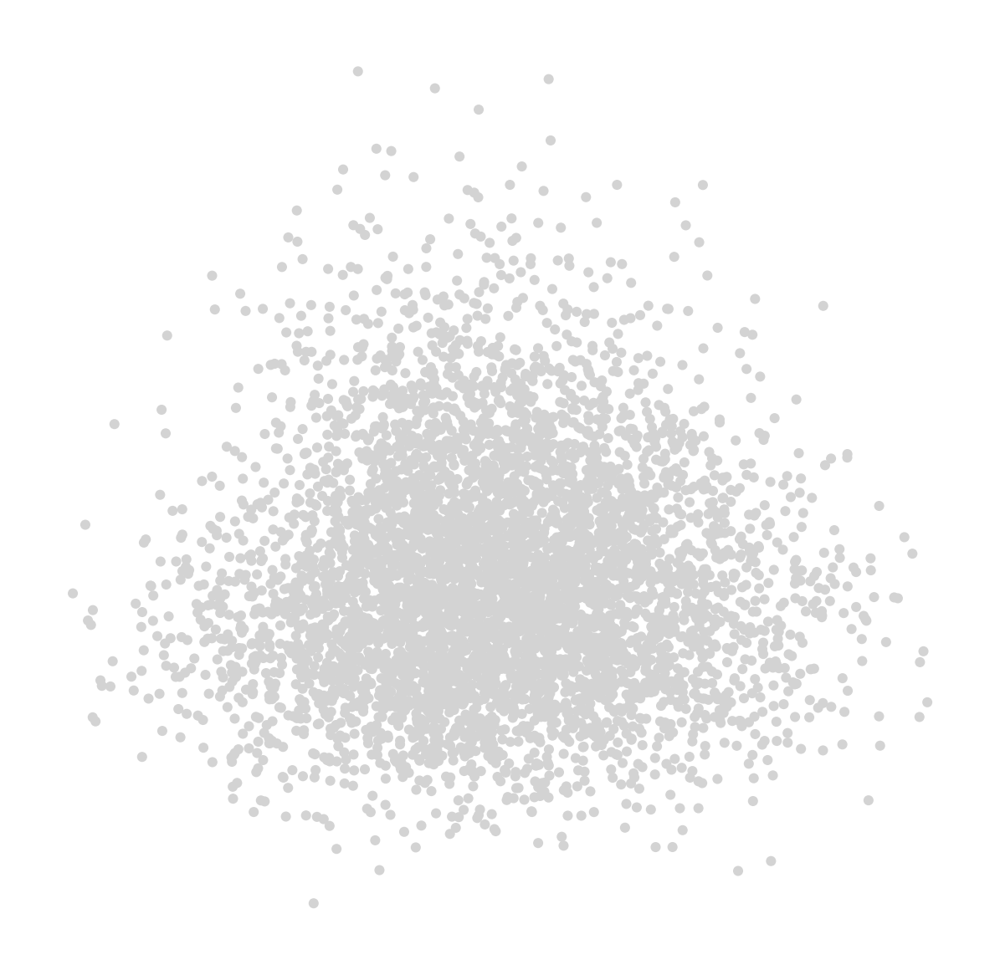

In [14]:
# Total-count normalize (library-size correct) the data matrix to 10,000 reads per cell
sc.pp.normalize_total(adata, target_sum=1e2)
# Logarithmize the data
sc.pp.log1p(adata)
# Regress out total counts
sc.pp.regress_out(adata, 'total_counts')
# Convert gene expressions to Z-scores
sc.pp.scale(adata, max_value=10)
# Principal component analysis
sc.tl.pca(adata, svd_solver='arpack')
# Plot the PCA results
sc.pl.pca(adata)

In [15]:
%%time
# Computing the neighborhood graph
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)

Wall time: 5.9 s


In [16]:
%%time
# Clustering
sc.tl.leiden(adata, resolution=2)

Wall time: 1.15 s


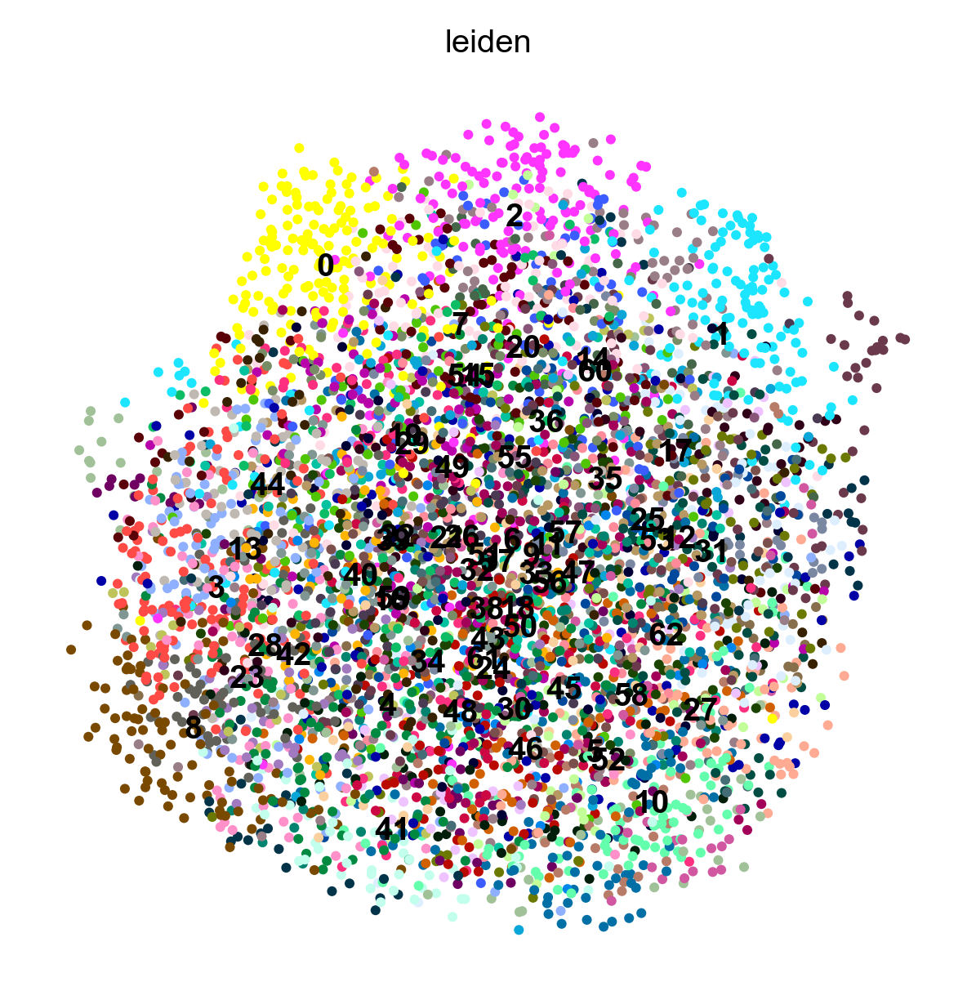

Wall time: 11.3 s


In [17]:
%%time
# Embed with UMAP
sc.tl.umap(adata)
# Plot the UMAP
sc.pl.umap(adata, color='leiden', legend_loc='on data')

In [144]:
adata.obs

,fov,volume,center_x,center_y,min_x,max_x,min_y,max_y,n_genes_by_counts,total_counts,leiden
Unnamed: 0,,,,,,,,,,,
103529204712210764556211240960146546805,0,678.749307,-3596.039947,-1591.205946,-3602.422747,-3589.657147,-1596.562746,-1585.849146,12,13.0,16
106033122839048120945740409056265984567,0,987.901893,-3640.805948,-1745.699950,-3648.970749,-3632.641148,-1751.758750,-1739.641150,18,21.0,21
119160032394064953404616996141630638395,0,1158.270952,-3620.015948,-1590.719946,-3627.586748,-3612.445148,-1597.858746,-1583.581146,27,32.0,20
120595568238180094191102379308850510305,0,899.550588,-3688.217950,-1775.939951,-3694.978750,-3681.457149,-1782.214751,-1769.665151,15,16.0,33
123872247052647939039154614775773521631,0,927.929102,-3638.105948,-1751.261950,-3645.838749,-3630.373148,-1757.698750,-1744.825150,28,32.0,26
...,...,...,...,...,...,...,...,...,...,...,...
71816988916567469020651008368301244297,60,1251.853562,-549.813987,-826.758019,-556.250787,-543.377187,-835.354820,-818.161219,19,31.0,47
75571927383018607824418121669262973356,60,1605.643695,-489.495986,-825.894019,-498.470786,-480.521185,-834.274820,-817.513219,25,30.0,14
77970631544813501622348858884694478732,60,1577.908510,-469.569985,-808.241419,-479.570785,-459.569185,-815.158819,-801.324019,13,15.0,26


<IPython.core.display.Javascript object>


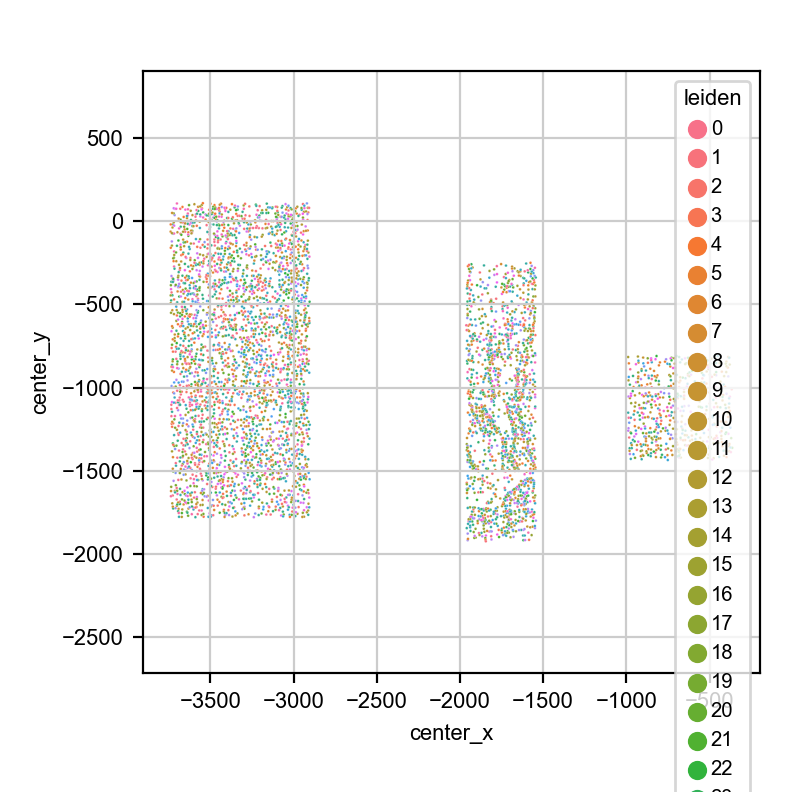

(-3907.437679399643,
 -195.26485382495446,
 -2024.647204523068,
 210.3598378255032)

In [147]:
plt.figure()
sns.scatterplot(data=adata.obs, x='center_x', y='center_y', hue='leiden', s=1)
plt.axis('equal')

<IPython.core.display.Javascript object>


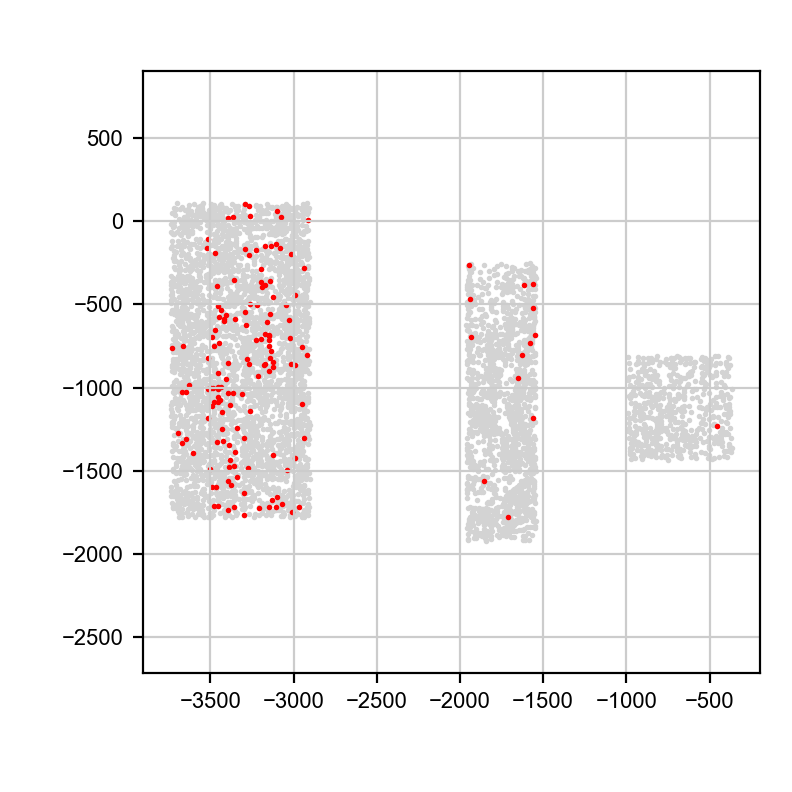

(-3907.437679399643,
 -195.26485382495446,
 -2024.647204523068,
 210.3598378255032)

In [148]:
import matplotlib.pyplot as plt
plt.figure()
plt.scatter(adata.obs['center_x'], adata.obs['center_y'], c='lightgrey', s=1)

df = adata.obs[adata.obs['leiden'] == '2']
plt.scatter(df['center_x'], df['center_y'], c='red', s=1)
plt.axis('equal')

<IPython.core.display.Javascript object>


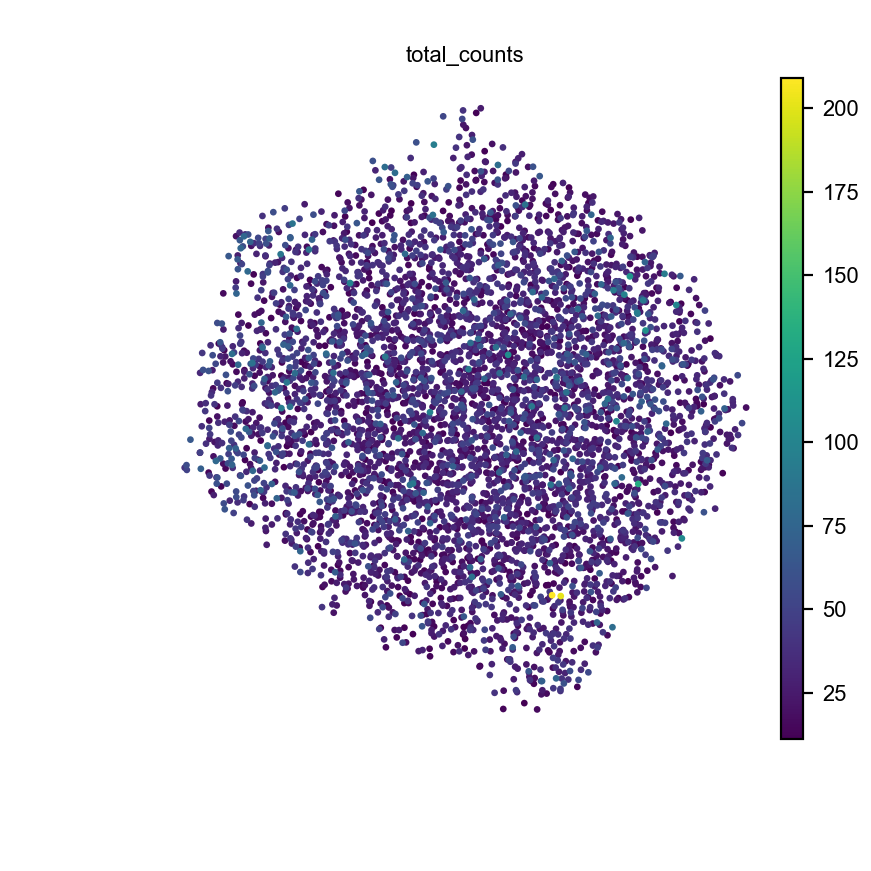

In [149]:
sc.pl.umap(adata, color='total_counts')

In [150]:
marker_genes = ['Slc17a7', 'Slc32a1', 'Slc30a3', 'Cux2', 'Rorb', 'Sulf2', 'Ptpru', 'Car3', 'Fam84b', 'Syt6', 
               'Nxph4', 'Tshz2', 'Pvalb', 'Sst', 'Vip', 'Sncg', 'Lamp5', 'Sox10', 'Pdgfra', 'Aqp4', 'Igf2',
               'Ctss', 'Cldn5', 'Flt1', 'Bgn', 'Vtn']
marker_genes = [g for g in marker_genes if (g in adata.var.index)]

<IPython.core.display.Javascript object>


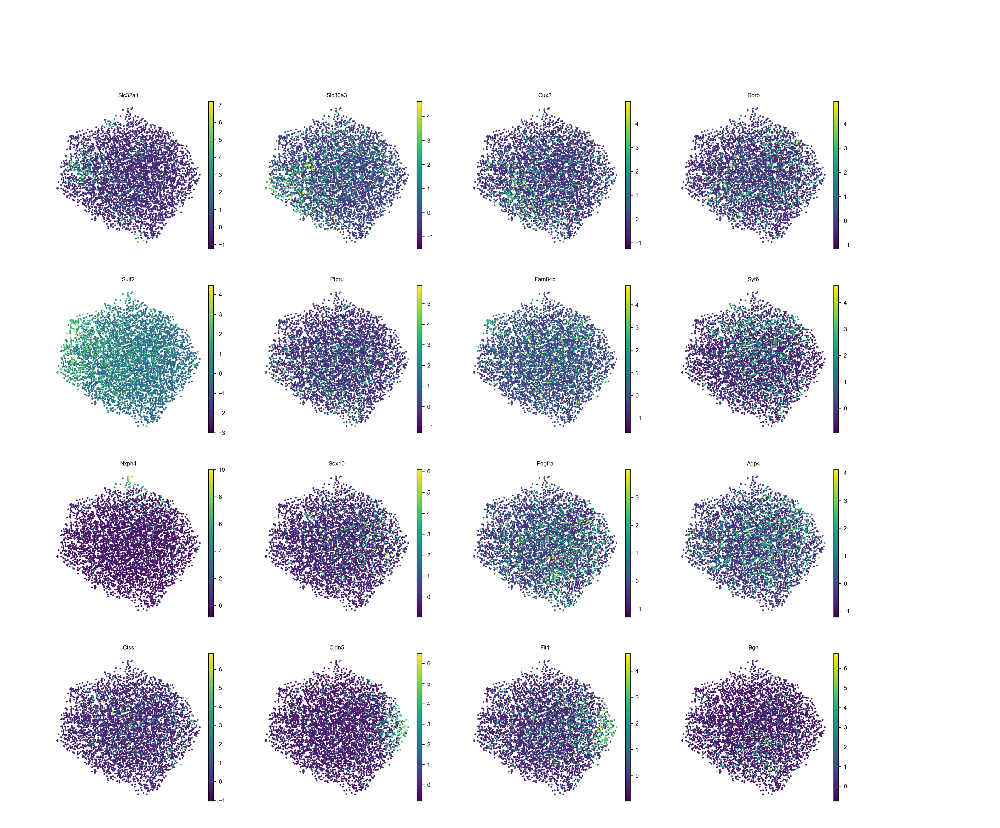

In [151]:
sc.pl.umap(adata, color=marker_genes)

In [104]:
from PIL import Image

In [63]:
import skimage.io as skio
imstack1    = skio.imread(r'J:\MERFISH_Analysis\20210529-P_Forebrain_MERFISH4_CTP09_exp2_test\FiducialCorrelationWarp\images\aligned_images0.tif', plugin="tifffile")

In [64]:
ims = []
for _i in range(int(len(imstack1)/8)):
    ims.append(imstack1[_i*8:(_i+1)*8])

In [65]:
%run "..\..\Startup_py3.py"
sys.path.append(r"..\..\..\..\Documents")

import ImageAnalysis3 as ia
%matplotlib notebook

from ImageAnalysis3 import *
print(os.getpid())

27352


<IPython.core.display.Javascript object>


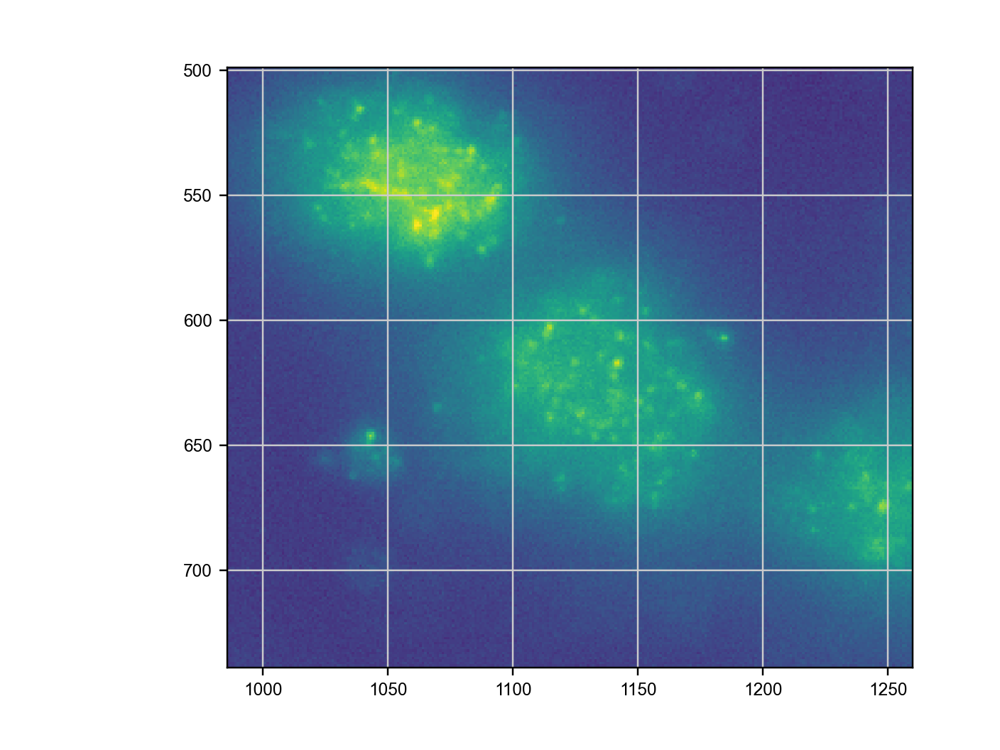

In [73]:
plt.figure()
plt.imshow(ims[0][5], vmin=5000, vmax=12000)

<IPython.core.display.Javascript object>


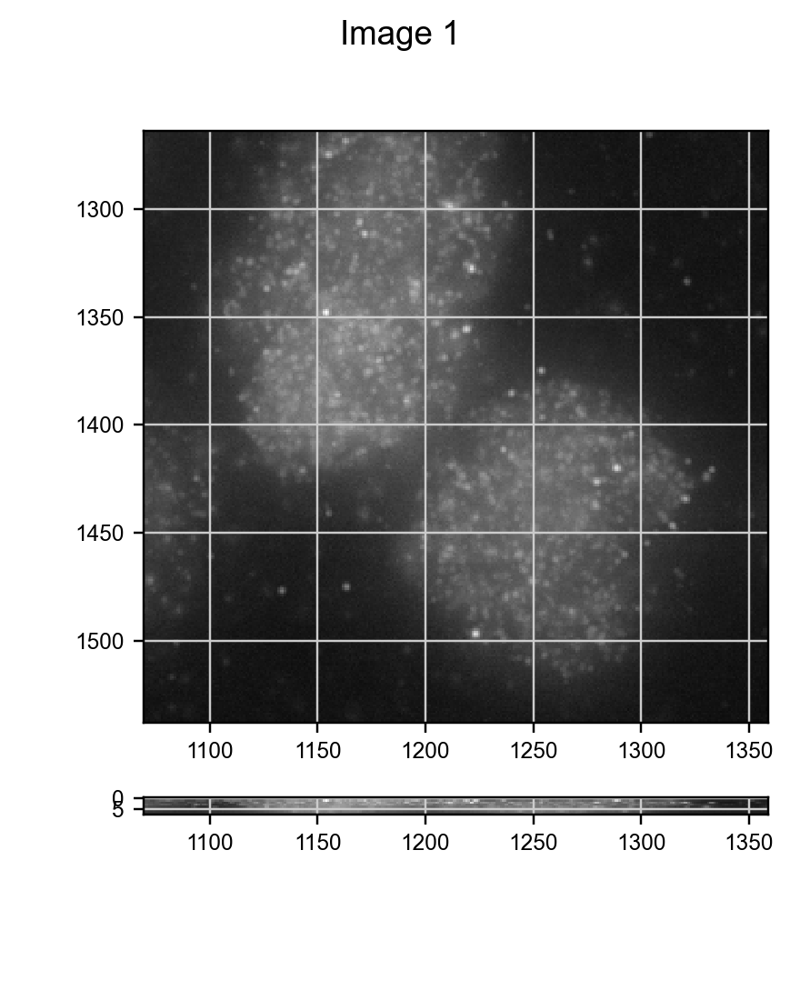

In [66]:
visual_tools.imshow_mark_3d_v2(ims)